In [1]:
import numpy as np
from scipy.linalg import inv
import matplotlib.pyplot as plt
%matplotlib inline

from typhon.plots import profile_p, profile_z, styles
from typhon.arts import xml
from typhon.physics import frequency2wavenumber
plt.style.use(styles.get('typhon'))

In [2]:
project_name = "eresmaa_retrieval"
project_path = f"/scratch/uni/u237/users/mprange/phd/iasi_retrieval/{project_name}"

p_grid = xml.load(f"{project_path}/a_priori/a_priori_p.xml")
z_grid = xml.load(f"{project_path}/a_priori/a_priori_z.xml")

a_priori_vmr = xml.load(f"{project_path}/a_priori/a_priori_vmr.xml")
a_priori_t = xml.load(f"{project_path}/a_priori/a_priori_temperature.xml")
f_backend = xml.load(f"{project_path}/sensor/f_backend.xml")
k_grid = frequency2wavenumber(f_backend)
cov_h2o = xml.load(f"{project_path}/a_priori/covariance_H2O, H2O-SelfContCKDMT252, H2O-ForeignContCKDMT252.xml")
cov_t = xml.load(f"{project_path}/a_priori/covariance_T.xml")
cov_y = xml.load(f"{project_path}/sensor/covariance_y.xml")
cov_x = xml.load(f"{project_path}/a_priori/covmat_sx.xml")
true_atm_fields = xml.load(f"{project_path}/observations/tropical_ocean_clearsky_eresmaal137_all_q_atm_fields.xml")

ybatch_n_total = 165
ybatch_n = 10
retrieved_vmr = []
retrieved_t = []
retrieved_ts = []
retrieved_y = []
retrieved_jacobian = []
true_vmr = []
true_t = []
true_y = []
true_jacobian = []
oem_diagnostics = []
for ybatch_start in range(0, ybatch_n_total, ybatch_n):
    while ybatch_n_total - (ybatch_start + ybatch_n) < 0:
        ybatch_n -= 1
    [oem_diagnostics.append(profile) for profile in xml.load(f"{project_path}/retrieval_output/"
              f"oem_diagnostics_batch_profiles_{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [retrieved_vmr.append(profile) for profile in 
     xml.load(f"{project_path}/retrieval_output/retrieved_h2o_vmr_batch_profiles_"
              f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [retrieved_t.append(profile) for profile in 
     xml.load(f"{project_path}/retrieval_output/retrieved_temperature_batch_profiles_"
              f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [retrieved_ts.append(profile) for profile in 
     xml.load(f"{project_path}/retrieval_output/retrieved_surface_temperature_batch_profiles_"
              f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [retrieved_y.append(profile) for profile in 
     xml.load(f"{project_path}/retrieval_output/retrieved_y_batch_profiles_"
              f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [retrieved_jacobian.append(profile) for profile in 
     xml.load(f"{project_path}/retrieval_output/retrieved_jacobian_batch_profiles_"
              f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [true_vmr.append(profile[6][:,0,0]) for profile in 
     true_atm_fields[ybatch_start:ybatch_start + ybatch_n]]
    [true_t.append(profile[0][:,0,0]) for profile in 
     true_atm_fields[ybatch_start:ybatch_start + ybatch_n]]
    [true_y.append(profile) for profile in xml.load(f"{project_path}/observations/"
                  "tropical_ocean_clearsky_eresmaal137_all_q_1190_1400_2150_2400_cm-1"
                  f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
    [true_jacobian.append(profile) for profile in xml.load(f"{project_path}/observations/"
                  "tropical_ocean_clearsky_eresmaal137_all_q_1190_1400_2150_2400_cm-1_jacobian"
                  f"{ybatch_start}-{ybatch_start + ybatch_n}.xml")]
 

tornado.application - ERROR - Exception in callback functools.partial(<function Kernel.enter_eventloop.<locals>.advance_eventloop at 0x7ff950140f80>)
Traceback (most recent call last):
  File "/dev/shm/u237002/anaconda/lib/python3.7/site-packages/tornado/ioloop.py", line 743, in _run_callback
    ret = callback()
  File "/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel/kernelbase.py", line 310, in advance_eventloop
    eventloop(self)
TypeError: 'NoneType' object is not callable


In [3]:
retrieved_vmr = [vmr for enum, vmr in enumerate(retrieved_vmr) if np.round(oem_diagnostics[enum][0]) == 0.]
retrieved_t = [t for enum, t in enumerate(retrieved_t) if np.round(oem_diagnostics[enum][0]) == 0.]
retrieved_ts = [ts for enum, ts in enumerate(retrieved_ts) if np.round(oem_diagnostics[enum][0]) == 0.]
retrieved_y = [y for enum, y in enumerate(retrieved_y) if np.round(oem_diagnostics[enum][0]) == 0.]
retrieved_jacobian = [jacobian for enum, jacobian in enumerate(retrieved_jacobian) 
                      if np.round(oem_diagnostics[enum][0]) == 0.]
true_vmr = [vmr for enum, vmr in enumerate(true_vmr) if np.round(oem_diagnostics[enum][0]) == 0.]
true_t = [t for enum, t in enumerate(true_t) if np.round(oem_diagnostics[enum][0]) == 0.]
true_y = [y for enum, y in enumerate(true_y) if np.round(oem_diagnostics[enum][0]) == 0.]
true_jacobian = [jacobian for enum, jacobian in enumerate(true_jacobian) 
                 if np.round(oem_diagnostics[enum][0]) == 0.]

In [29]:
axs[0].fill_between?

Object `fill_between` not found.


In [ ]:
axs[0].fill_between

In [4]:
# Averaging Kernel
def averaging_kernel(K, Sa, Sy):
    return inv(K.T @ inv(Sy) @ K + inv(Sa)) @ K.T @ inv(Sy) @ K

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this war

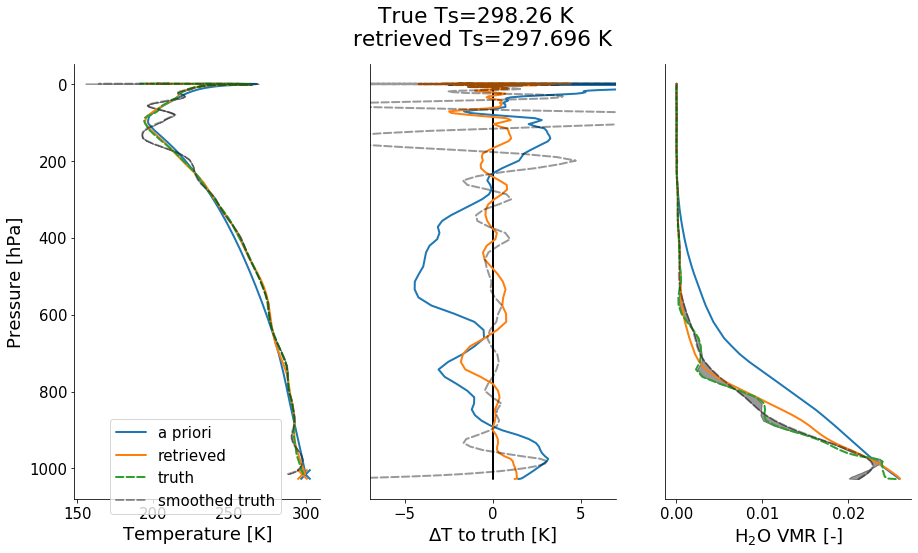

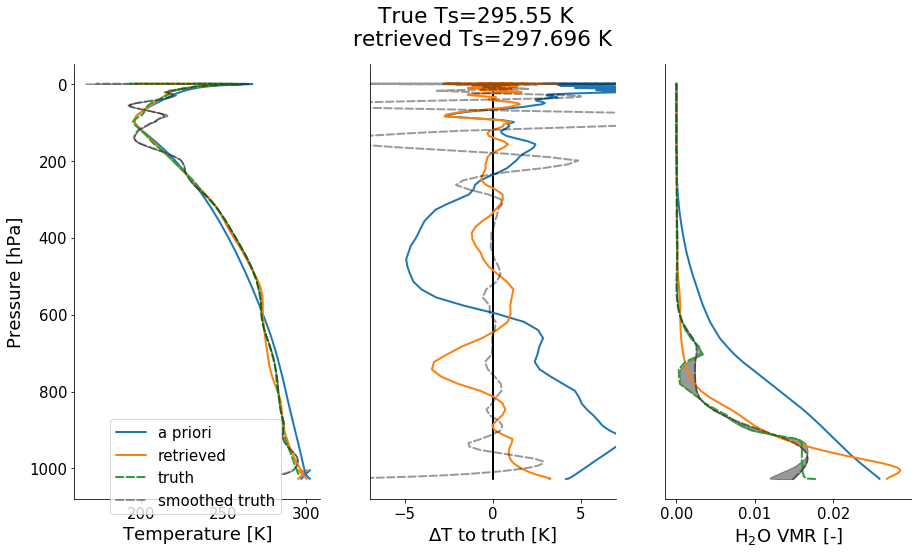

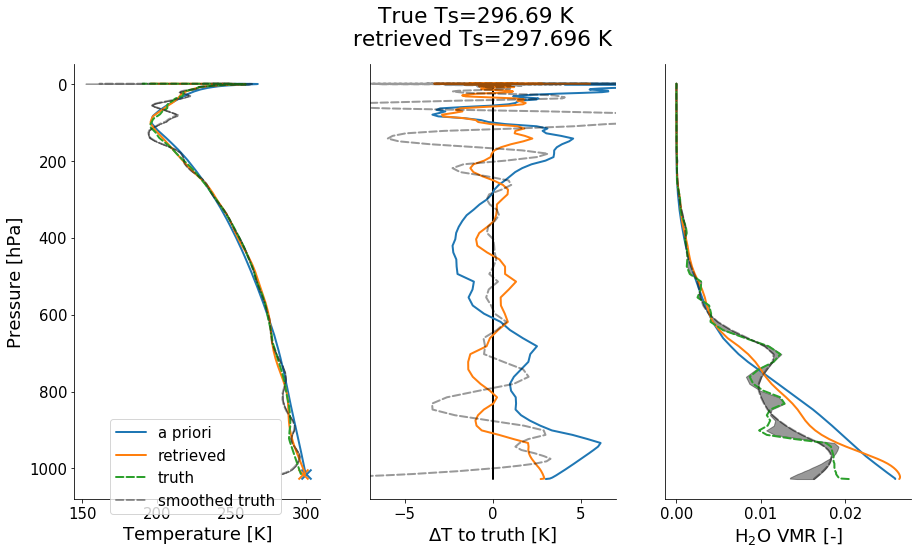

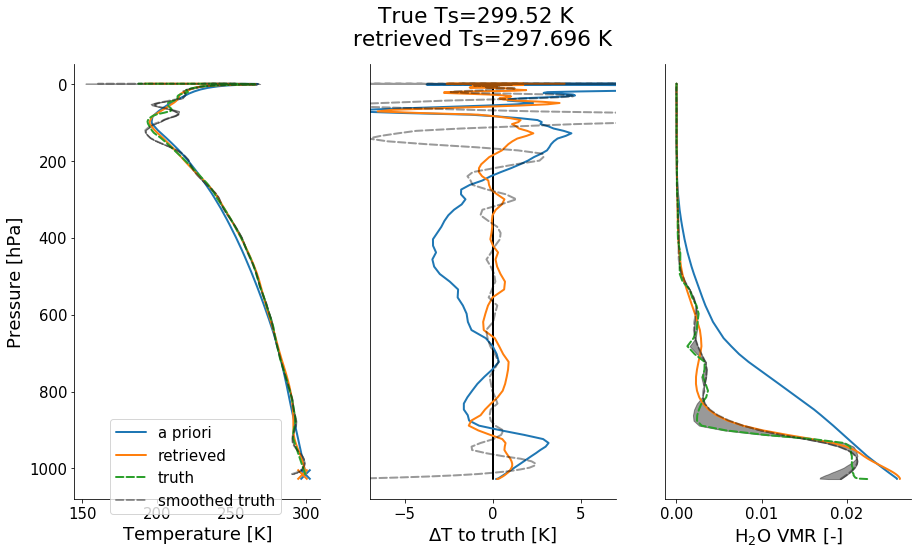

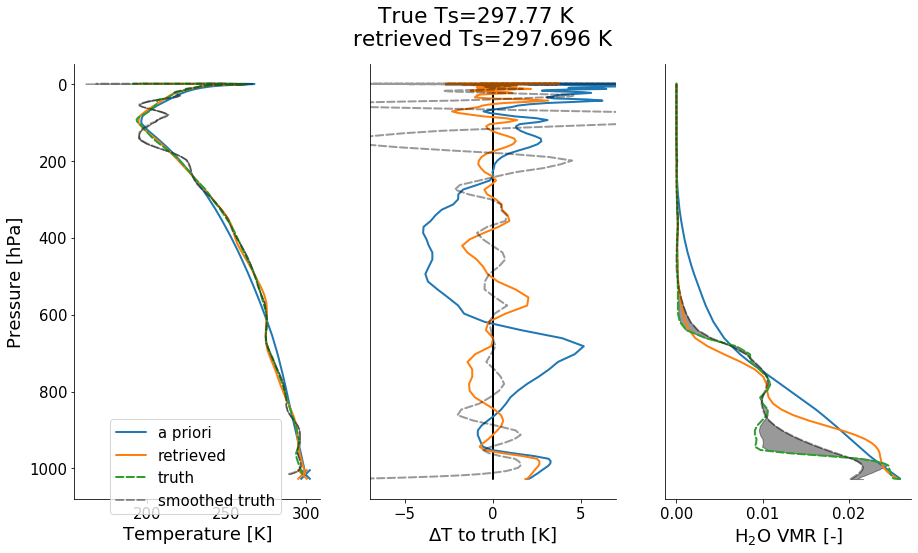

...

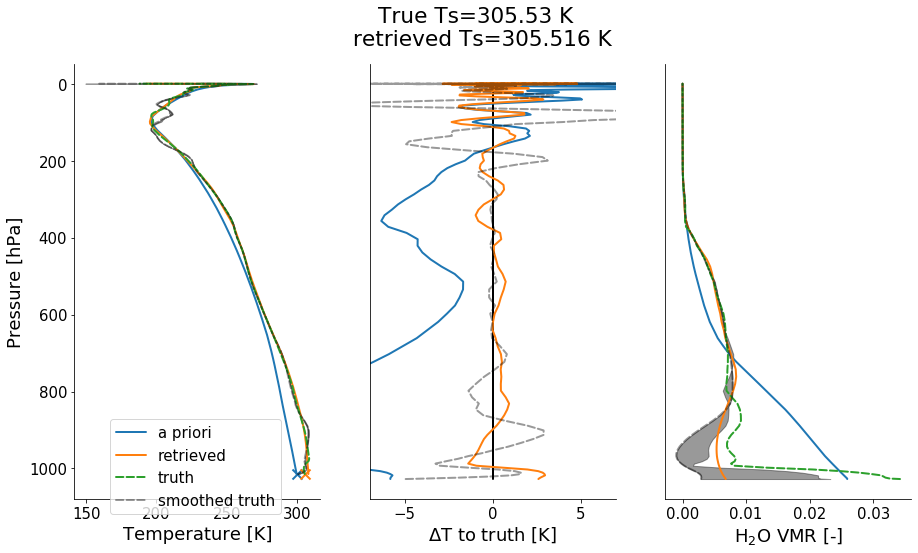

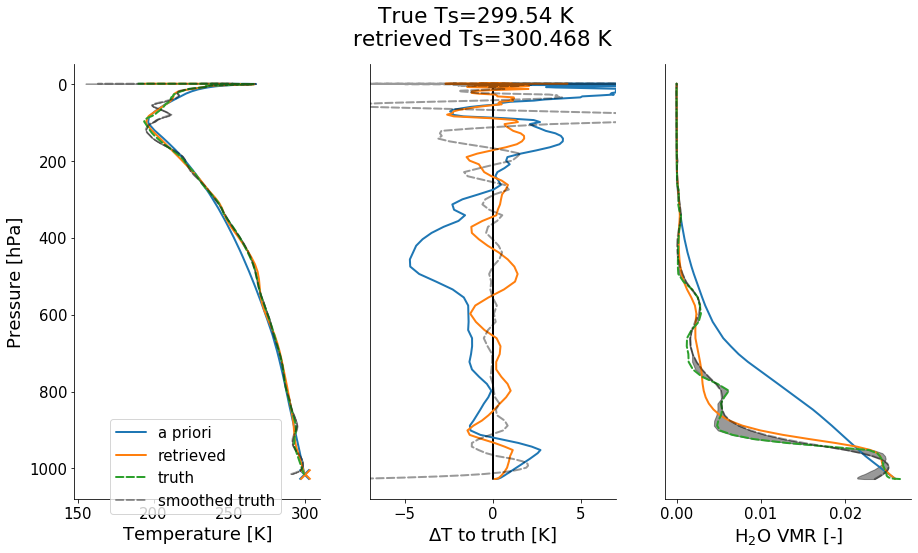

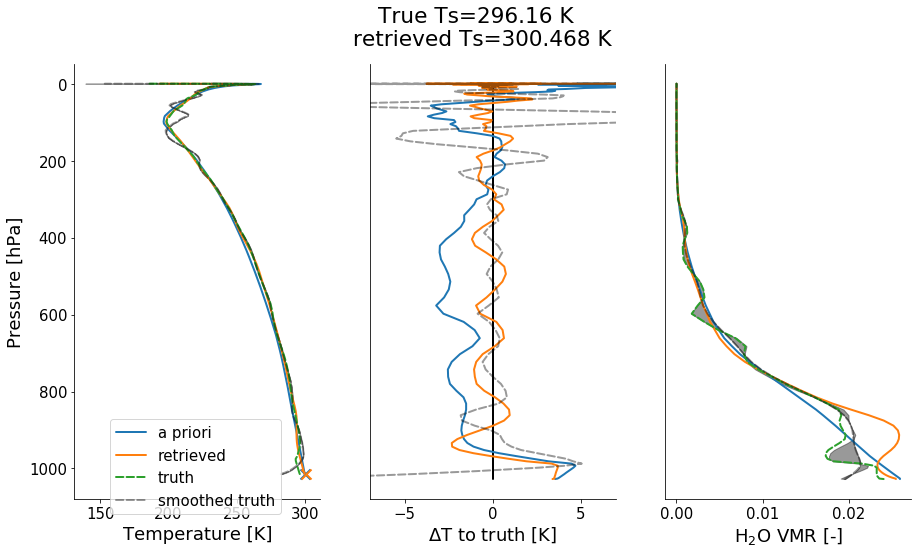

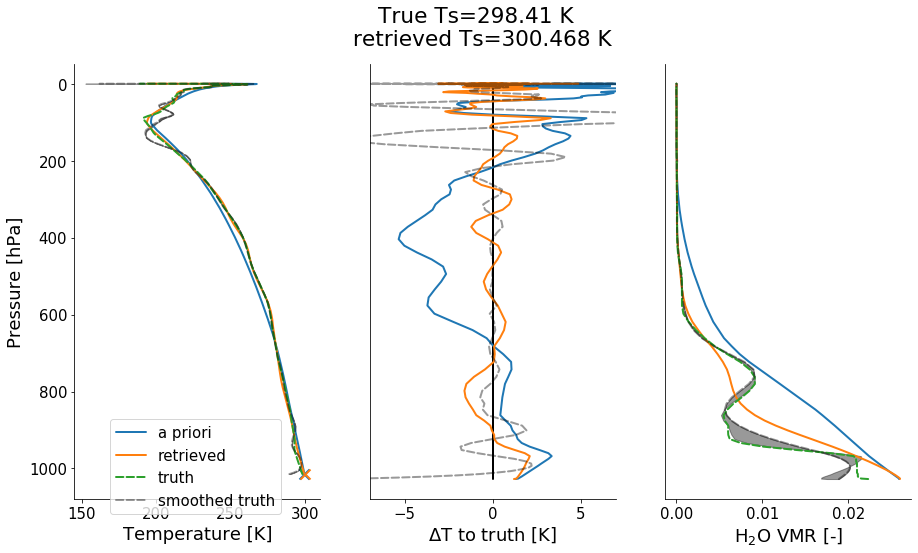

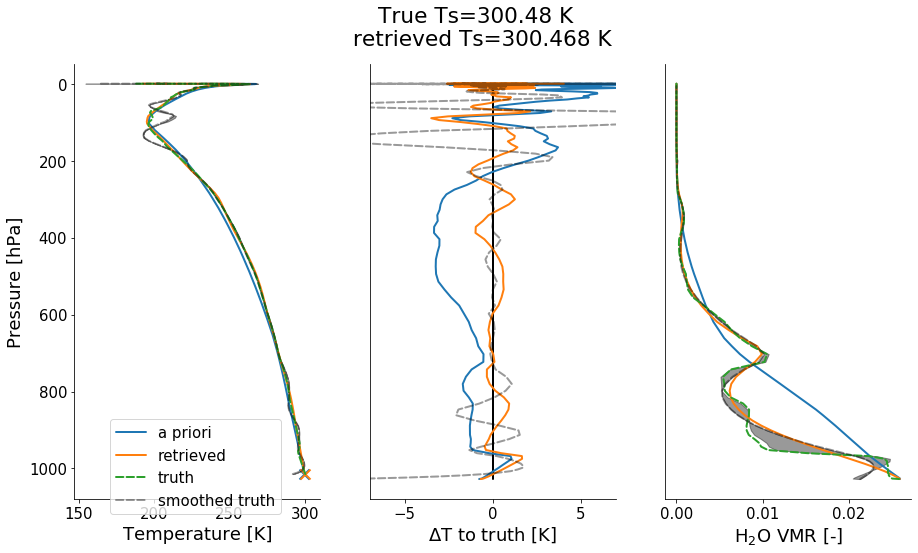

In [58]:
for ind in range(len(retrieved_vmr)):
    fig, axs = plt.subplots(ncols=3, figsize=(15, 8))
    colormap = plt.cm.plasma
    profile_p(p_grid, a_priori_t[:,0,0], label="a priori", ax=axs[0])
    profile_p(p_grid, retrieved_t[ind], label="retrieved", ax=axs[0], )
    profile_p(p_grid, true_t[ind], label="truth", ax=axs[0], linestyle="--")
    axs[0].set_xlabel("Temperature [K]")

    profile_p(p_grid, np.zeros(len(p_grid)), label="retrieved", ax=axs[1], color="k")
    profile_p(p_grid, a_priori_t[:,0,0] - true_t[ind], 
              color="#1f77b4", label="a priori", ax=axs[1])
    profile_p(p_grid, retrieved_t[ind] - true_t[ind], 
              color="#ff7f0e", label="retrieved", ax=axs[1])
    axs[1].set_xlim([-7, 7])
    axs[1].set_xlabel("$\Delta$T to truth [K]")

    profile_p(p_grid, a_priori_vmr[0,:,0,0], label="a priori", ax=axs[2])
    profile_p(p_grid, retrieved_vmr[ind], label="retrieved", ax=axs[2])
    profile_p(p_grid, true_vmr[ind], label="truth", ax=axs[2], linestyle="--")
    axs[0].scatter(a_priori_t[0,0,0], p_grid[0], marker="x", s=100, linewidths=10)
    axs[0].scatter(retrieved_ts[ind], p_grid[0], marker="x", s=100, linewidths=10)
    plt.suptitle(f"True Ts={np.round(true_t[ind][0], 3)} K \n "
                 f"retrieved Ts={np.round(retrieved_ts[ind][0, 0], 3)} K")
    axs[2].set_xlabel("H$_2$O VMR [-]")
    axs[0].legend()
    
    A = averaging_kernel(true_jacobian[ind][:,:138], cov_t, cov_y)
#     axs[3].set_prop_cycle(color=[colormap(i) for i in np.linspace(0, 0.9, len(A))])
#     axs[3].set_xlim([-10, 20])
#     for irow in range(len(A)):
#         profile_p(p_grid, A[irow,:], ax=axs[3])
#     profile_p(p_grid, np.sum(A[:,:], axis=1), ax=axs[3], color="black", linewidth=1.5)
#     profile_p(p_grid, np.ones(len(p_grid)), linestyle="--", color="gray", ax=axs[3])
    profile_p(p_grid, A @ true_t[ind], color="black", 
              alpha=0.4, linestyle="--", ax=axs[0], label="smoothed truth")
    profile_p(p_grid, (A @ true_t[ind]) - true_t[ind], 
              color="black", linestyle="--", alpha=0.4, ax=axs[1], label="smoothed truth")
    t_smoothing_error = (A - np.identity(A.shape[0])) @ (true_t[ind] - a_priori_t[:,0,0])
    axs[0].fill_betweenx(p_grid, (A @ true_t[ind]) - t_smoothing_error, (A @ true_t[ind]), 
                        facecolor='black', alpha=0.4, color='black')
#     profile_p(p_grid, t_smoothing_error, color="red", 
#               alpha=0.4, linestyle="--", ax=axs[3], label="smoothed truth")
    #axs[3].set_ylim([0, 2.e4])
#     axs[3].set_title("Temperature")
#     axs[3].set_xlabel("Smoothing Error [K]", fontsize=15)

    A = averaging_kernel(true_jacobian[ind][:,138:], cov_h2o, cov_y)
#     axs[4].set_prop_cycle(color=[colormap(i) for i in np.linspace(0, 0.9, len(A))])
#     axs[4].set_xlim([-0.3, 1.4])
#     for irow in range(len(A)):
#         profile_p(p_grid, A[irow,:], ax=axs[4])
#     profile_p(p_grid, np.sum(A[:,:], axis=1), ax=axs[4], color="black", linewidth=1.5)
#     profile_p(p_grid, np.ones(len(p_grid)), linestyle="--", color="gray", ax=axs[4])
    profile_p(p_grid, A @ true_vmr[ind], color="black", linestyle="--", alpha=0.4, ax=axs[2], 
              label="smoothed truth")
    vmr_smoothing_error = (A - np.identity(A.shape[0])) @ (true_vmr[ind] - a_priori_vmr[0,:,0,0])
    axs[2].fill_betweenx(p_grid, A @ true_vmr[ind], A @ true_vmr[ind] - vmr_smoothing_error, 
                         facecolor='black', alpha=0.4, color='black')
#     profile_p(p_grid, vmr_smoothing_error, color="red", 
#               alpha=0.4, linestyle="--", ax=axs[4])
#     #axs[4].set_ylim([0, 2.e4])
#     axs[4].set_title("H$_2$O VMR")
#     axs[4].set_xlabel(" \n Smoothing Error [-]", fontsize=15)


    axs[0].legend(bbox_to_anchor=(0.87, 0.2))
    axs[1].axes.get_yaxis().set_visible(False)
    axs[2].axes.get_yaxis().set_visible(False)
#     axs[3].axes.get_yaxis().set_visible(False)
#     axs[4].axes.get_yaxis().set_visible(False)
    # [axs[i].set_ylim([p_grid[0], 2e4]) for i in range(5)]

# plt.savefig(f"{project_path}/plots/retrieval_profiles_eresmaa1_apriori.pdf")

In [55]:
t_smoothing_error

array([-4.98218328e-01, -2.85725802e-01, -1.83153883e-01, -1.18035757e-01,
       -6.71234608e-02, -2.93291575e-02, -4.14667025e-03,  6.94154171e-03,
        5.03879487e-03, -1.72762289e-02, -6.34845154e-02, -1.08576043e-01,
       -1.63961251e-01, -1.97970447e-01, -2.01420291e-01, -1.47626263e-01,
        1.53174038e-02,  3.28702955e-01,  7.53591875e-01,  5.40602619e-01,
        3.62495579e-01, -1.18839053e-01, -1.75741586e-01, -2.62640489e-01,
       -3.60413192e-01, -4.07117687e-01, -1.88908480e-01,  4.16281501e-02,
        7.24654252e-02,  1.64697786e-01,  2.46397567e-01,  1.81147879e-01,
       -9.05242299e-03, -3.09763785e-01,  1.31722871e-01, -9.47519336e-02,
        2.99595449e-02,  3.16200462e-01, -2.17307514e-02, -2.21131741e-01,
       -1.60989567e-01,  1.06905238e-01,  2.69432929e-01, -2.81002749e-01,
        5.06553459e-03,  1.15296812e-01, -2.82085887e-02, -6.44710931e-02,
        5.00610632e-02, -1.30241260e-02,  1.59383001e-03,  2.34198683e-02,
       -1.75440894e-02,  

In [60]:
vmr_error = np.log10(np.array(retrieved_vmr)) - np.log10(np.array(true_vmr))
vmr_error = np.where(~np.isnan(vmr_error), vmr_error, 0)
t_error = np.array(retrieved_t) - np.array(true_t)
t_error = np.where(~np.isnan(t_error), t_error, 0)
    

(1019.4, 0.010002)

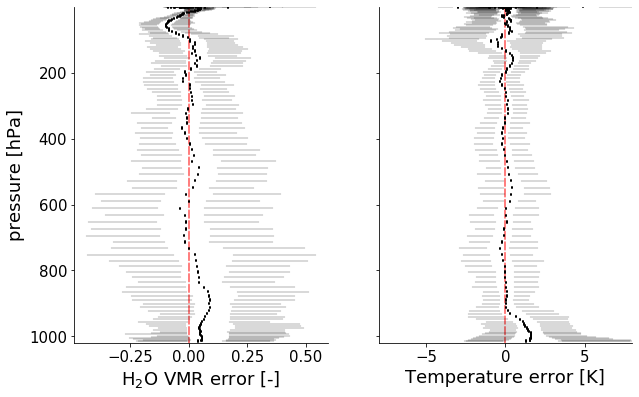

In [62]:
fig, axs = plt.subplots(ncols=2, sharey=True)
axs[0].plot(np.zeros(len(p_grid)), p_grid, linestyle='--', color='red', alpha=0.5)
bw = axs[0].boxplot(vmr_error, positions=p_grid / 100., 
                 vert=False, showfliers=False, showbox=False,
                 showcaps=False, manage_ticks=False, widths=4.0,
                 medianprops=
                 {
                    'linewidth': 2.0,
                     'color': 'black',
                 },
                 whiskerprops=
                 {
                     'linewidth': 0.3,
                 },
                 boxprops=
                 {
                     'linewidth': 0.2,
                 }
                )
# axs[0].set_xlim([-0.03, 0.03])
axs[0].set_xlabel('H$_2$O VMR error [-]')
axs[0].set_ylabel('pressure [hPa]')
axs[0].set_ylim([p_grid.max() / 100. + 5., p_grid.min() / 100.])

axs[1].plot(np.zeros(len(p_grid)), p_grid, linestyle='--', color='red', alpha=0.5)
bw = axs[1].boxplot(t_error, positions=p_grid / 100., 
                 vert=False, showfliers=False, showbox=False,
                 showcaps=False, manage_ticks=False, widths=4.0,
                 medianprops=
                 {
                    'linewidth': 2.0,
                     'color': 'black',
                 },
                 whiskerprops=
                 {
                     'linewidth': 0.3,
                 },
                 boxprops=
                 {
                     'linewidth': 0.2,
                 }
                )
axs[1].set_xlim([-8, 8])
axs[1].set_xlabel('Temperature error [K]')
axs[1].set_ylim([p_grid.max() / 100. + 5., p_grid.min() / 100.])

In [223]:
np.log10(vmr_error)

/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.
/dev/shm/u237002/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log10
  """Entry point for launching an IPython kernel.


array([[-3.31655243, -2.85513437, -2.83020206, ..., -5.75343516,
        -5.62882136, -5.51626927],
       [-2.04025031, -1.99189323, -1.97183169, ..., -5.7911515 ,
        -5.61023011, -5.48216684],
       [-2.22396479, -2.15988   , -2.13888316, ..., -5.69779322,
        -5.63333343, -5.51786934],
       ...,
       [-2.84524049, -2.73109687, -2.80501666, ...,         nan,
        -6.02123715, -5.63029167],
       [-2.43235904, -2.34631585, -2.33021631, ..., -6.46596447,
        -5.87147057, -5.56318413],
       [-4.15761981, -3.06756191, -3.06994486, ..., -6.40286087,
        -5.85016456, -5.57400435]])

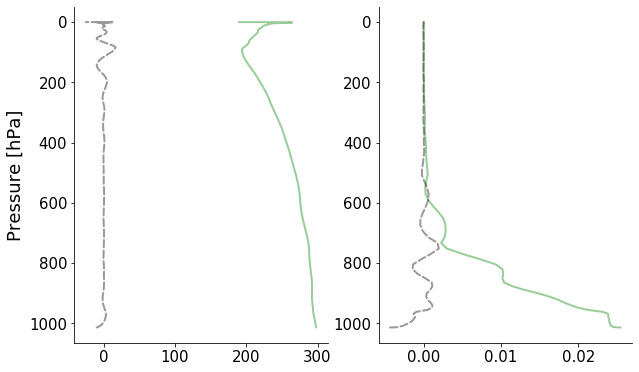

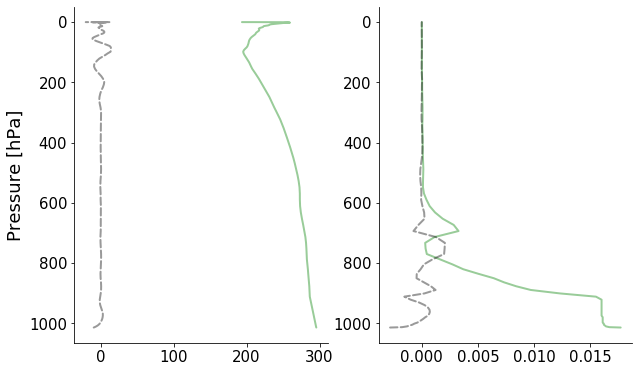

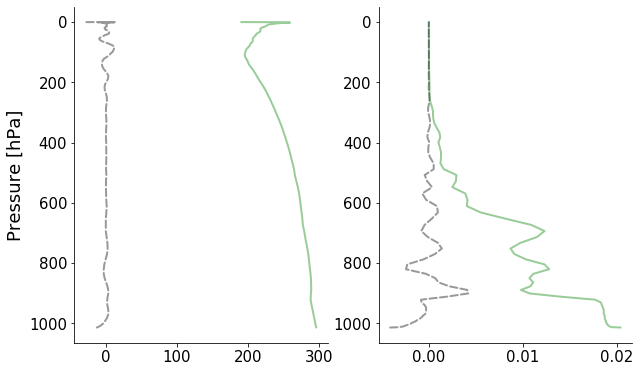

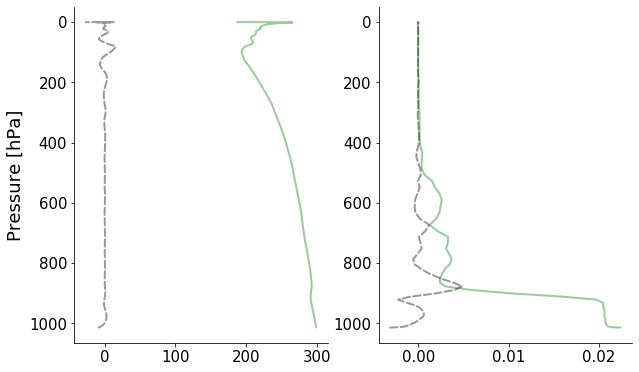

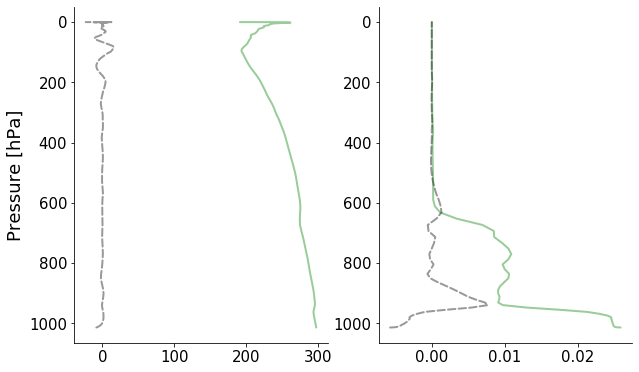

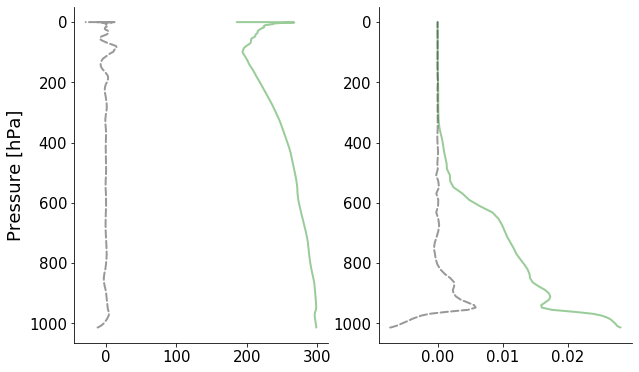

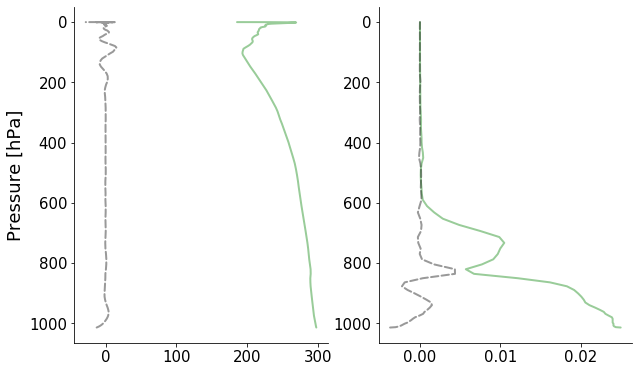

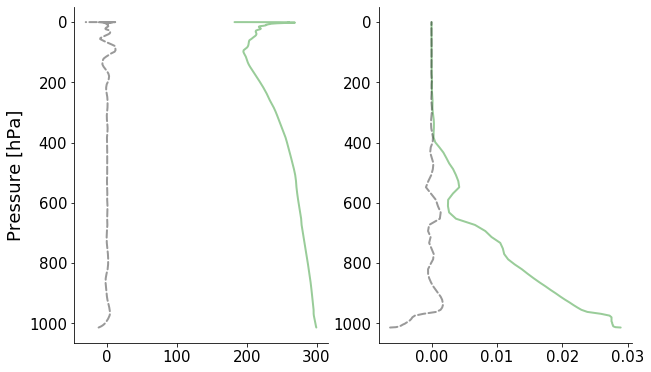

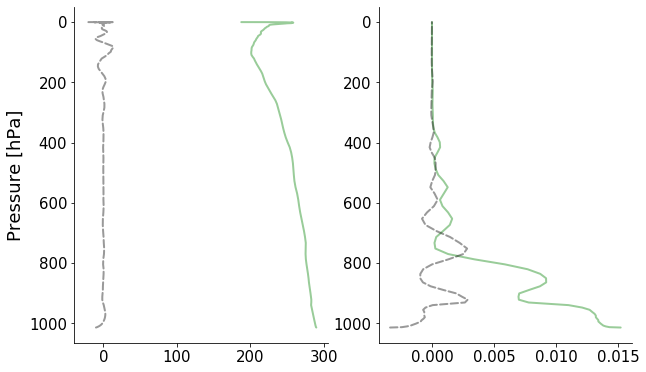

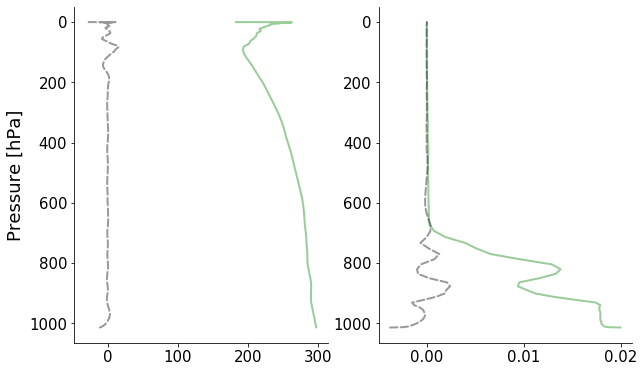

In [46]:
for ind in range(10):
    fig, axs = plt.subplots(ncols=2)
    A = averaging_kernel(true_jacobian[ind][:,:138], cov_t, cov_y)
    true_t_smoothed = (A - np.identity(A.shape[0])) @ true_t[ind]
    profile_p(p_grid, true_t[ind], color="green", 
              alpha=0.4, ax=axs[0], label="truth")
    profile_p(p_grid, true_t_smoothed, color="black", 
              alpha=0.4, linestyle="--", ax=axs[0], label="smoothed truth")
    A = averaging_kernel(true_jacobian[ind][:,138:], cov_h2o, cov_y)
    true_vmr_smoothed = (A - np.identity(A.shape[0])) @ true_vmr[ind]
    profile_p(p_grid, true_vmr[ind], color="green", 
              alpha=0.4, ax=axs[1], label="truth")
    profile_p(p_grid, true_vmr_smoothed, color="black", 
              alpha=0.4, linestyle="--", ax=axs[1], label="smoothed truth")

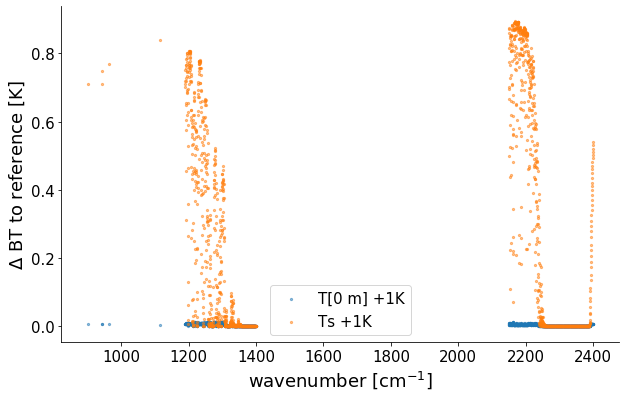

In [123]:
ref_y = xml.load(project_path + "/retrieval_output/y_reference.xml")
atm_pert_y = xml.load(project_path + "/retrieval_output/y_lowest_atm_layer_plus1K.xml")
Ts_pert_y = xml.load(project_path + "/retrieval_output/y_t_surface_plus1K.xml")

plt.scatter(k_grid / 100, atm_pert_y - ref_y, s=5, label="T[0 m] +1K", alpha=0.5)
plt.scatter(k_grid / 100, Ts_pert_y - ref_y, s=5, label="Ts +1K", alpha=0.5)
plt.legend()
plt.xlabel("wavenumber [cm$^{-1}$]")
plt.ylabel("$\Delta$ BT to reference [K]")
plt.savefig(project_path + "/plots/delta_tb_for_dtatm0_vs_dts.pdf")

In [7]:
Sa_T = xml.load(project_path +
                "/a_priori/covariance_T.xml")
Sa_h2o = xml.load(project_path + 
                  "/a_priori/covariance_H2O, H2O-SelfContCKDMT252, H2O-ForeignContCKDMT252.xml")
Sx = np.block([
    [Sa_T, np.zeros(Sa_T.shape)], 
    [np.zeros(Sa_T.shape), Sa_h2o]])

S = np.zeros(Sa_T.shape)
S[np.diag_indices_from(S)] = [np.sqrt(Sx[0, 0] * Sx[43, 43]) * np.exp(-1 / 1500 * z_grid[i] ) for i in range(43)]

cl = corr_length_cov(z_grid)
for i in range(S.shape[1]):
    for j in range(S.shape[0]):
        cl_mean = (cl[i] + cl[j]) / 2
        s = (S[j, j] + S[i, i]) / 2
        S[i, j] = s * np.exp(-np.abs(z_grid[i] - z_grid[j]) / cl_mean)

#Sx[i, j] = np.exp(-1500 * z_grid[])
Sx = np.block([
    [Sa_T, S], 
    [S, Sa_h2o]])



In [14]:
np.block([
    [Sa_T, np.zeros(Sa_T.shape), np.zeros((43, 1))],
    [np.zeros(Sa_T.shape), Sa_T, np.zeros((43, 1))],
    [np.zeros((1, 43)), np.zeros((1, 43)), np.array([[100]])]
]).shape

(87, 87)

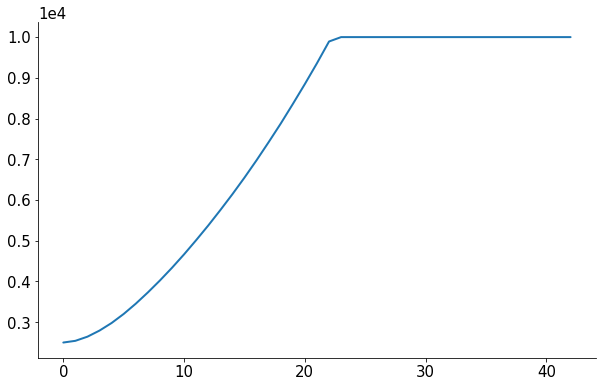

In [4]:
def corr_length_cov(z, trpp=12.5e3):
    """Return correlation lengths for given altitudes.
    Parameters:
        z (np.array): Height levels [m]
        trpp (float): Tropopause height [m]

    Returns:
        np.array: Correlation length for each heigth level.

    """
    f = np.poly1d(np.polyfit(x=(0, trpp), y=(2.5e3, 10e3), deg=1))
    cl = f(z)
    cl[z > trpp] = 10e3

    return cl
plt.plot(corr_length_cov(z=z_grid))

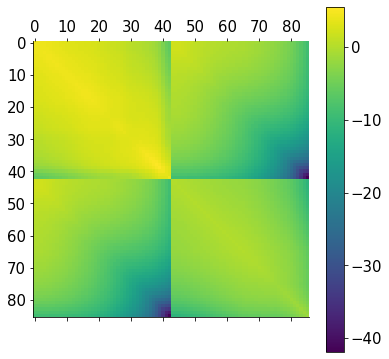

In [33]:
a = plt.matshow(np.log(Sx))
plt.colorbar(a)

ValueError: too many values to unpack (expected 2)

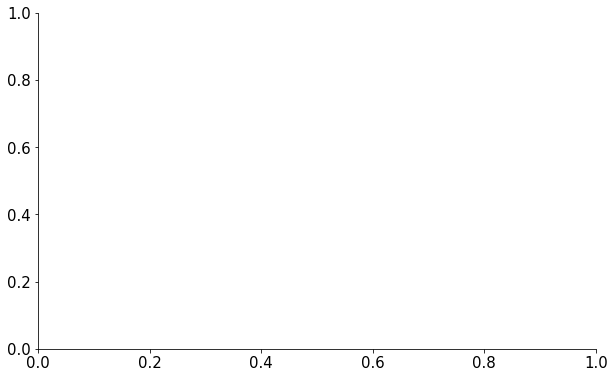

In [41]:
fig, ax = plt.subplots(nrows=1, sharex=True)
mesh = ax.pcolormesh(k_grid/100, p_grid/100,
              true_jacobian[0][:,:43].T ,
              cmap="seismic",
              norm=MidpointNormalize(midpoint=0, vmin=-1, vmax=1),
              )
ax.invert_yaxis()
ax.set_xlabel("wavenumber [cm$^{-1}$]")
ax.set_ylabel("pressure [hPa]")
fig.colorbar(mesh,ax=ax, label="[K/K]")
ax.set_title("T Jacobian")
ax.set_ylim([1013, 800])
#plt.savefig(project_path + "/plots/retrieved_temperature_jacobian_only_T_retrieved.pdf")

fig, ax = plt.subplots(nrows=1, sharex=True)
mesh = ax.pcolormesh(k_grid/100, p_grid/100,
              true_jacobian[0][:,43:].T ,
              cmap="seismic",
              norm=MidpointNormalize(midpoint=0),
              )
ax.invert_yaxis()
ax.set_xlabel("wavenumber [cm$^{-1}$]")
ax.set_ylabel("pressure [hPa]")
fig.colorbar(mesh,ax=ax, label="[K/100%VMR]")
ax.set_title("H2O Jacobian")
#plt.savefig(project_path + "/plots/true_h2o_vmr_jacobian_only_T_retrieved.pdf")

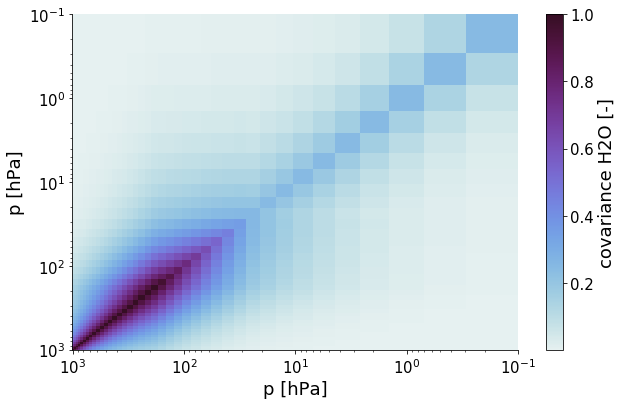

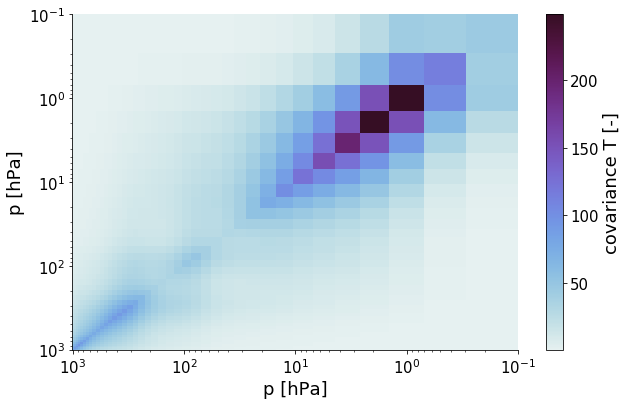

In [7]:
fig, ax = plt.subplots()
mesh = ax.pcolormesh(p_grid / 100, p_grid / 100,
              Sx,
              cmap="density",
              #norm=MidpointNormalize(midpoint=0),
              )
ax.set_yscale("log")
ax.set_xscale("log")
ax.invert_yaxis()
ax.invert_xaxis()
ax.set_xlabel("p [hPa]")
ax.set_ylabel("p [hPa]")
fig.colorbar(mesh, label="covariance H2O [-]")
#plt.savefig("/scratch/uni/u237/users/mprange/phd/iasi_retrieval/plots/cov_h2o.pdf")

fig, ax = plt.subplots()
mesh = ax.pcolormesh(p_grid / 100, p_grid / 100,
              cov_t,
              cmap="density",
              #norm=MidpointNormalize(midpoint=0),
              )
ax.set_yscale("log")
ax.set_xscale("log")
ax.invert_yaxis()
ax.invert_xaxis()
ax.set_xlabel("p [hPa]")
ax.set_ylabel("p [hPa]")
fig.colorbar(mesh, label="covariance T [-]")
plt.savefig("/scratch/uni/u237/users/mprange/phd/iasi_retrieval/plots/cov_t.pdf")

In [40]:
import matplotlib.colors as colors
# set the colormap and centre the colorbar
class MidpointNormalize(colors.Normalize):
    """
    Normalise the colorbar so that diverging bars work there way either side from a prescribed midpoint value)

    e.g. im=ax1.imshow(array, norm=MidpointNormalize(midpoint=0.,vmin=-100, vmax=100))
    """
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y), np.isnan(value))

1

Text(0, 0.5, 'z [km]')

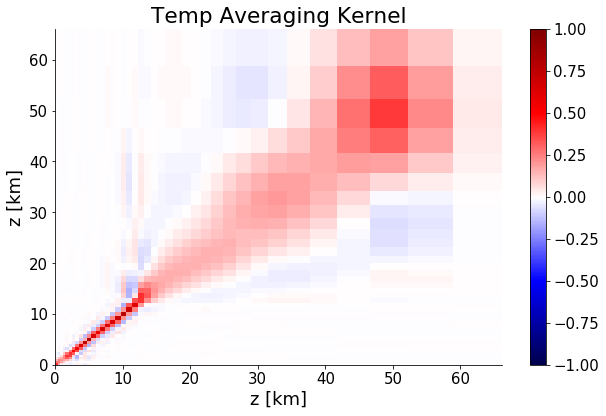

In [58]:
A = averaging_kernel(retrieved_jacobian[0][:,43:], cov_h2o, cov_y)

fig, ax = plt.subplots(nrows=1, sharex=True)
mesh = ax.pcolormesh(z_grid / 1000, z_grid / 1000,
              A,
              cmap="seismic",
              norm=MidpointNormalize(midpoint=0, vmin=-1, vmax=1),
              )
fig.colorbar(mesh,ax=ax)
ax.set_title("Temp Averaging Kernel")
ax.set_xlabel("z [km]")
ax.set_ylabel("z [km]")
#plt.savefig(f"{project_path}/plots/T_averaging_kernel_contour.pdf")

(0, 10000.0)

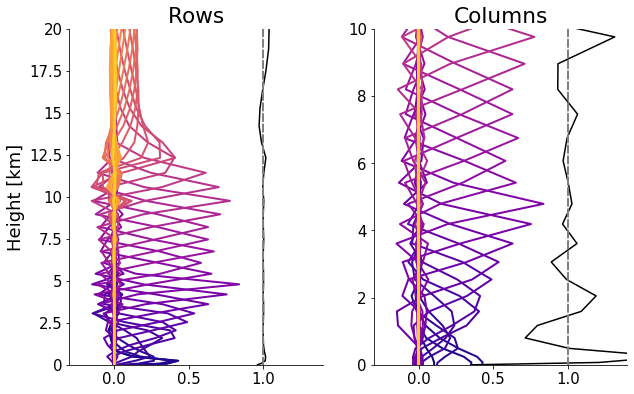

In [61]:
fig, axs = plt.subplots(ncols=2)
colormap = plt.cm.plasma
#rows
axs[0].set_prop_cycle(color=[colormap(i) for i in np.linspace(0, 0.9, len(A))])
axs[0].set_title("Rows")
axs[0].set_xlim([-0.3, 1.4])
for irow in range(len(A)):
    profile_z(z_grid, A[irow,:], ax=axs[0])
profile_z(z_grid, np.sum(A[:,:], axis=1), ax=axs[0], color="black", linewidth=1.5)
profile_z(z_grid, np.ones(len(p_grid)), linestyle="--", color="gray", ax=axs[0])
axs[0].set_ylim([0, 2.e4])
#columns
axs[1].set_prop_cycle(color=[colormap(i) for i in np.linspace(0, 0.9, len(A))])
axs[1].set_title("Columns")
axs[1].set_xlim([-0.3, 1.4])
for icol in range(len(A)):
    profile_z(z_grid, A[:,icol], ax=axs[1])
profile_z(z_grid, np.sum(A[:,:], axis=0), ax=axs[1], color="black", linewidth=1.5)
profile_z(z_grid, np.ones(len(p_grid)), linestyle="--", color="gray", ax=axs[1])
#plt.savefig(f"{project_path}/plots/h2o_averaging_kernel_rows_columns.pdf")
axs[1].set_ylim([0, 1e4])